# **1.0 About Author**
- **Author**: Atif Ali Khokhar

- **About Me**:
    - I am Atif Ali Khokhar, Information Technology student at University of Sindh, currently specailizing in field of Data Science.
    - I upload my work on Kaggle on Daily Basis you can also check my work and if you like my work appreciate me by upvoting my work on Kaggle.
    - You can also connect with me on LinkedIn Link is provided


- **Contact Info**
    - [Linkedin]('https://www.linkedin.com/in/atifalikhokhar')

# **2.0 About Project**
- **Project Title**: Flower Classification using CNN

- **Task** :
    - Here are images of 14 different kind of flowers.
    - The Task is to build a CNN model that can classify flowers with high accuracy.
    - The images which are provided are mentioned below.

- **Flower Names** :
    - Astilbe
    - Bellflower
    - Black_eyed_susan
    - Calendua
    - California_poppy
    - Carnation
    - Common_daisy
    - Coreopsis
    - Dandelion
    - Iris
    - Rose
    - Sunflower
    - Tulip
    - Water_lily

# **3.0 Data Processing**

### **3.1 Importing Libraries** 

In [1]:
# For data manipulation
import numpy as np 
import pandas as pd 

# For data visualization
import matplotlib.pyplot as plt 
import seaborn as sns

# Ingore the warnings
import warnings
warnings.filterwarnings('ignore')

# DL Libraries
import tensorflow
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import image_dataset_from_directory

# Other libraries
import os
import random


2024-05-05 05:44:47.368271: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-05 05:44:47.368379: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-05 05:44:47.493960: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### **3.1 Loading Image Dataset from Directory**

In [2]:
# Load the image dataset from the directory using utils
# ds = image_dataset_from_directory('E:\DataScience Codanics\Kaggle\LAPTOP Items classification\PC Part Classification\Data')

train_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/d/atifaliak/flower-classification/Data//train',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)

val_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/d/atifaliak/flower-classification/Data//val',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)


Found 13642 files belonging to 14 classes.
Found 98 files belonging to 14 classes.


### **3.2 Visualize the images**

In [3]:
# Creating a function to visualize the images

def visualize_images(path, num_images=5):

    # Get a list of image filenames
    image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

    if not image_filenames:
        raise ValueError("No images found in the specified path")

    # Select random images
    selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

    # Create a figure and axes
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3), facecolor='white')

    # Display each image
    for i, image_filename in enumerate(selected_images):
        # Load image
        image_path = os.path.join(path, image_filename)
        image = plt.imread(image_path)

        # Display image
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(image_filename)  # Set image filename as title

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

In [4]:
# Extrating the class labels
classes = train_ds.class_names

ASTILBE


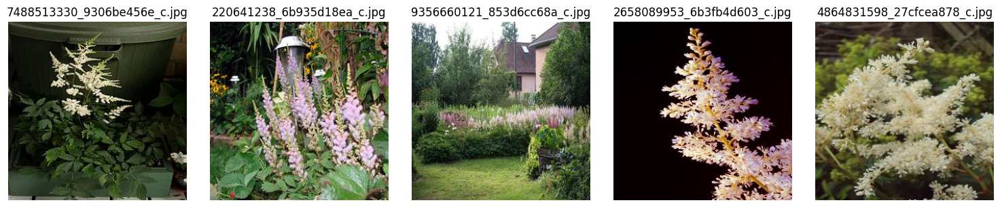

BELLFLOWER


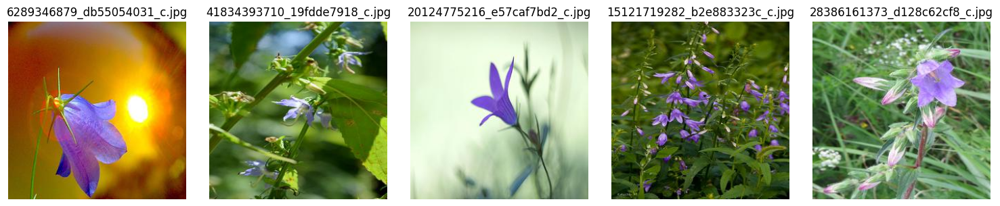

BLACK_EYED_SUSAN


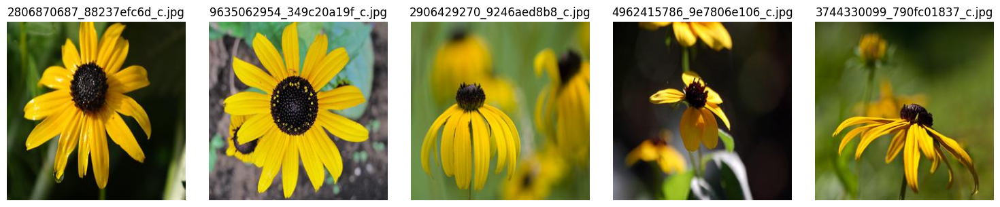

CALENDULA


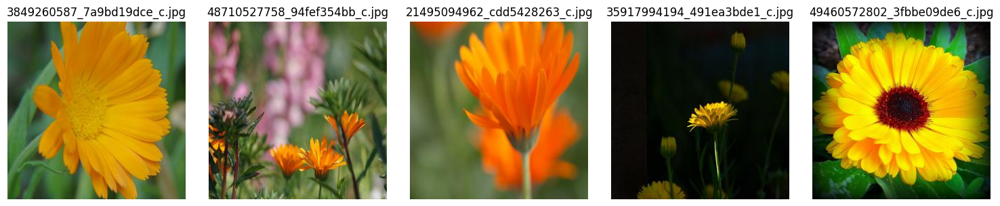

CALIFORNIA_POPPY


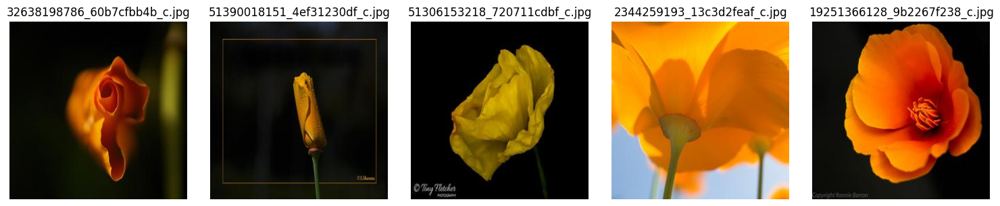

CARNATION


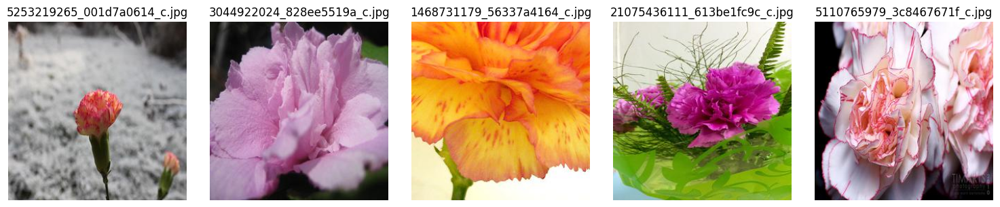

COMMON_DAISY


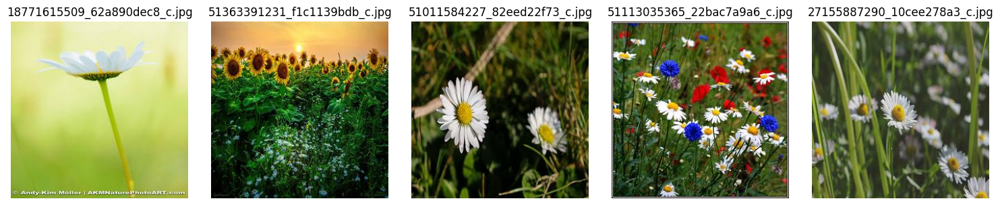

COREOPSIS


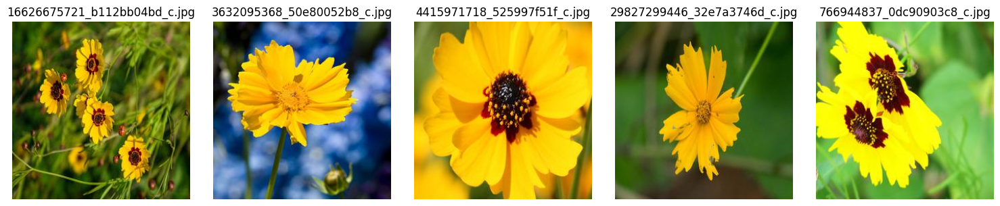

DANDELION


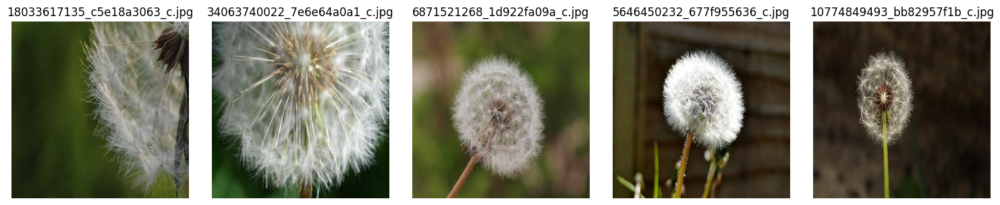

IRIS


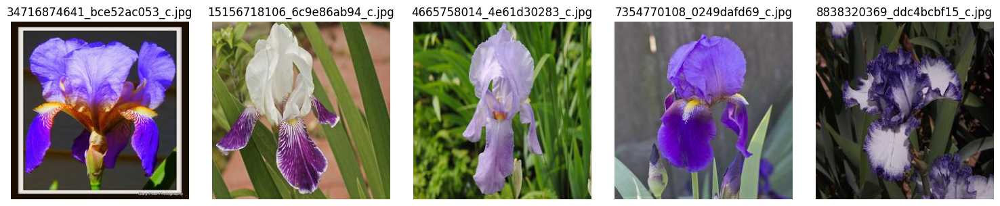

ROSE


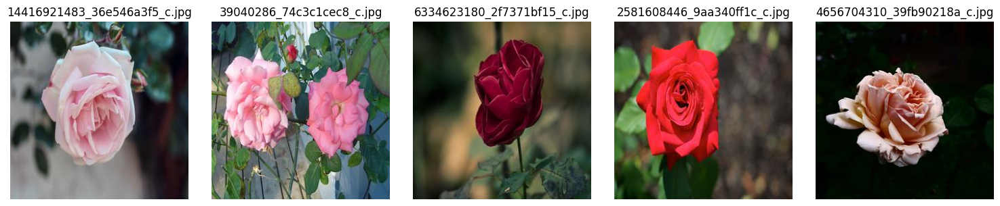

SUNFLOWER


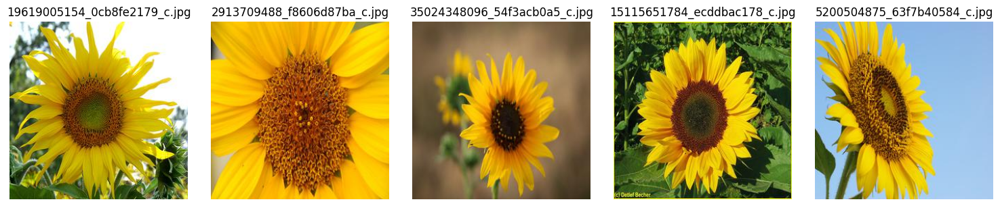

TULIP


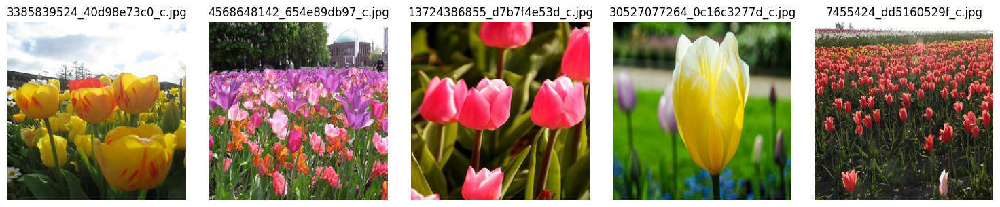

WATER_LILY


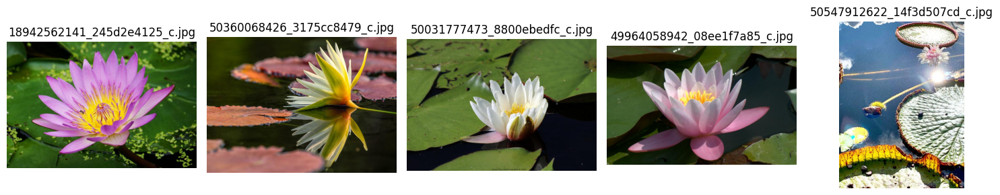

In [5]:
# Iterating through each class to plot its images
for label in classes:
    
    # Specify the path containing the images to visualize
    path_to_visualize = f"/kaggle/input/d/atifaliak/flower-classification/Data//train/{label}"

    # Visualize 5 random images
    print(label.upper())
    visualize_images(path_to_visualize, num_images=5)

# **4.0 Modeling**

### **4.1 Model Building**

In [6]:
model = Sequential()

model.add(Conv2D(32, kernel_size=(3, 3),activation='relu', input_shape=(256,256,3)))
model.add(BatchNormalization())
model.add(MaxPooling2D())

model.add(Conv2D(64, kernel_size=(3, 3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(32, activation='relu'))

model.add(Dense(14, activation='softmax'))

In [7]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 254, 254, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 125, 125, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 246016)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    62,980,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 14)             │           462 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 63,043,822 (240.49 MB)

 Trainable params: 63,043,630 (240.49 MB)

 Non-trainable params: 192 (768.00 B)

### **4.2 Model Compilation**

In [8]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

### **4.3 Model Training**

In [9]:
# Train the model

history = model.fit(train_ds, batch_size=32, epochs=30, validation_data=val_ds, verbose=1)

Epoch 1/30
  2/427 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.1328 - loss: 6.4609   

I0000 00:00:1714887938.905307      79 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1714887938.925140      79 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


427/427 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.1267 - loss: 7.5766

W0000 00:00:1714887979.667543      78 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


427/427 ━━━━━━━━━━━━━━━━━━━━ 60s 98ms/step - accuracy: 0.1267 - loss: 7.5687 - val_accuracy: 0.1531 - val_loss: 2.4717
Epoch 2/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.2256 - loss: 2.4082 - val_accuracy: 0.2959 - val_loss: 2.0514
Epoch 3/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.3218 - loss: 2.0274 - val_accuracy: 0.2959 - val_loss: 1.9442
Epoch 4/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.3836 - loss: 1.8415 - val_accuracy: 0.3469 - val_loss: 1.7402
Epoch 5/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4374 - loss: 1.6553 - val_accuracy: 0.4184 - val_loss: 1.5652
Epoch 6/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.4843 - loss: 1.4880 - val_accuracy: 0.4082 - val_loss: 1.7181
Epoch 7/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.5632 - loss: 1.2858 - val_accuracy: 0.4898 - val_loss: 1.5212
Epoch 8/30
427/427 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.6141 - loss: 1.1175 - val_accurac

### **4.4 Plotting the Graph**

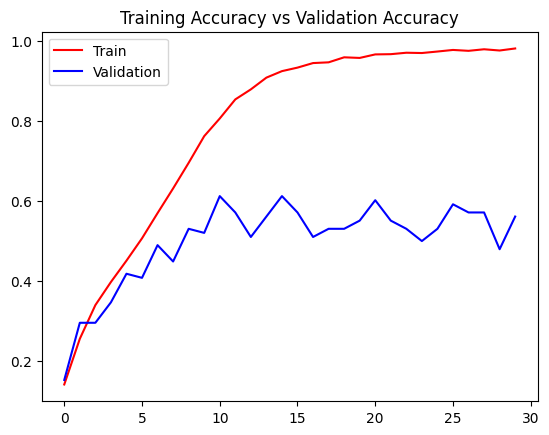

In [10]:
# Plotting the graph of Accuracy and Validation Accuracy
plt.title('Training Accuracy vs Validation Accuracy')

plt.plot(history.history['accuracy'], color='red',label='Train')
plt.plot(history.history['val_accuracy'], color='blue',label='Validation')

plt.legend()


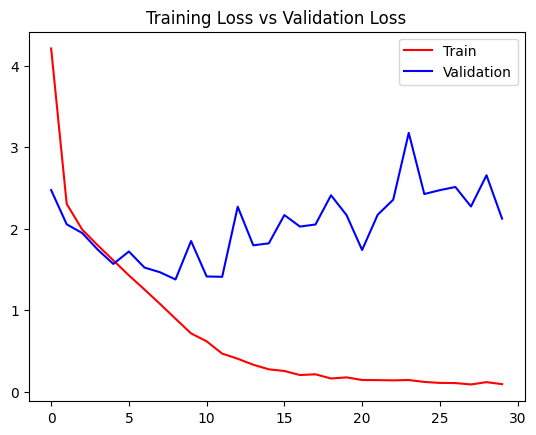

In [11]:
# Plotting the graph of Accuracy and Validation loss
plt.title('Training Loss vs Validation Loss')

plt.plot(history.history['loss'], color='red',label='Train')
plt.plot(history.history['val_loss'], color='blue',label='Validation')

plt.legend()

## **Thank You**